# Implementing Image Segmentation using 3 different models

* UNet++
* FPN
* DeepLab V3+



In [ ]:
%pip install torchviz
%matplotlib inline

#Installing the library containing some segmentation models
%pip install segmentation-models-pytorch
%pip install torch

In [4]:
import numpy as np
import pandas as pd
import os

import cv2
import random
import tqdm
from tqdm import notebook
import matplotlib.pyplot as plt

import torch
from PIL import Image
import torch.nn as nn
from torchviz import make_dot

#Importing the library into the notebook
import segmentation_models_pytorch as seg_models

In [ ]:
# download the cityscapes_data (zipped file)
!gdown --id 108BC3EEcT2eHhBj5gQUZfHE199nwQksc -O cityscapes_data.zip

In [ ]:
import os
import zipfile

# extract the downloaded dataset to a local directory: data
local_zip = 'cityscapes_data.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('data')
zip_ref.close()

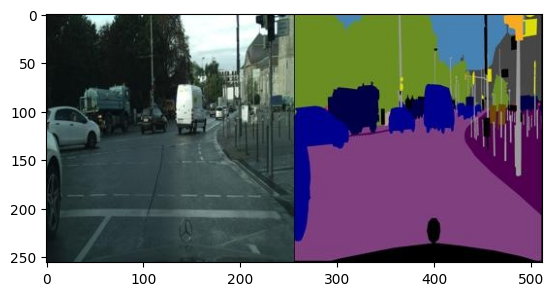

In [5]:
from PIL import Image
import matplotlib.pyplot as plt

image_dir = "data/cityscapes_data"
train_images = os.path.join(image_dir, 'train')
val_images = os.path.join(image_dir, 'val')

# List the files in the directories
train_files = os.listdir(train_images)
val_files = os.listdir(val_images)

# Print any image of your choice from the training set
s_no = 11 

img = Image.open(os.path.join(train_images, train_files[s_no])).convert("RGB")

plt.imshow(img)
plt.show()


In [6]:
class data_load(object):
    def __init__(self, images_dir, batch_size, shuffle = True, rescale = 1.00, target_size = (128, 128)):
        super(data_load, self).__init__()
        self.images_dir = images_dir
        self.batch_size = batch_size
        self.rescale = rescale
        self.shuffle = shuffle
        self.target_size = target_size
        self.filenames = [os.path.join(self.images_dir, filename) for filename in os.listdir(self.images_dir)]
        self.step_number = 0
        self.total_steps = int(len(self.filenames) // self.batch_size)

    def generate_batch(self):
        start = self.step_number * self.batch_size
        stop = (self.step_number + 1) * self.batch_size
        filenames_batch = self.filenames[start:stop]

        images_batch = [cv2.imread(filename) for filename in filenames_batch]
        images_batch = np.array([cv2.cvtColor(image, cv2.COLOR_BGR2RGB) for image in images_batch])

        # To separate images and their labels
        images_batch = np.array([(image[:, :256,], image[:, 256:]) for image in images_batch])

        images_batch = np.array([(cv2.resize(image, self.target_size), cv2.resize(mask, self.target_size)) for (image, mask) in images_batch], dtype = np.float32)
        images_batch = np.array([(np.moveaxis(image, -1, 0), np.moveaxis(mask, -1, 0)) for (image, mask) in images_batch])
        images_batch /= self.rescale
        images_batch = np.moveaxis(images_batch, 1, 0)

        return torch.Tensor(images_batch)

    def __next__(self):
        if self.step_number > self.total_steps:
            self.step_number = 0
        images, masks = self.generate_batch()
        self.step_number += 1
        return images, masks

    def __len__(self):
        return self.total_steps

In [ ]:
names = ["Unet++", "FPN",  "DeepLab V3+"]
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'identity'
models_dict = {

    "Unet++": seg_models.UnetPlusPlus(encoder_name="resnet50",encoder_weights=ENCODER_WEIGHTS,activation=ACTIVATION,classes=3),
    "FPN": seg_models.FPN(encoder_name="resnet50",encoder_weights=ENCODER_WEIGHTS,activation=ACTIVATION,classes=3),
    "DeepLab V3+": seg_models.DeepLabV3Plus(encoder_name="resnet50",encoder_weights=ENCODER_WEIGHTS,activation=ACTIVATION,classes=3),

}

In [8]:
def dice(pred, label):
    pred = (pred > 0).float()
    return 2. * (pred*label).sum() / (pred+label).sum()

In [9]:
def training(model, epochs, batch_size):

    train_generator = data_load(images_dir = train_images, batch_size = batch_size, rescale = 255.0)
    test_generator = data_load(images_dir = val_images, batch_size = batch_size, rescale = 255.0)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    main_pbar = tqdm.notebook.tqdm(range(epochs))
    main_pbar.set_description('common progress ')

    for epoch in main_pbar:
        running_params = dict(train_loss = [],
                            train_dice = [],
                            test_loss = [],
                            test_dice = [])
        train_pbar = tqdm.notebook.tqdm(range(len(train_generator)))

        for step in train_pbar:

            train_imgs, train_masks = next(train_generator)
            train_imgs, train_masks = train_imgs.to(device), train_masks.to(device)

            optimizer.zero_grad()

            train_predictions = model(train_imgs)

            train_loss = criterion(train_predictions, train_masks)
            train_loss.backward()

            train_dice = dice(pred = train_predictions, label = train_masks)

            optimizer.step()



            with torch.no_grad():
                test_images, test_masks = next(test_generator)
                test_images, test_masks = test_images.to(device), test_masks.to(device)

                test_predictions = model(test_images)

                test_loss = criterion(test_predictions, test_masks)

                test_dice = dice(pred = test_predictions, label = test_masks)


            current_metrics = dict(train_loss = [train_loss.item(), ],
                                train_dice = [train_dice.item(), ],
                                test_loss = [test_loss.item(),],
                                test_dice = [test_dice.item(),])

            running_params.update(current_metrics)

            mean_metrics = dict(zip(running_params.keys(), [(sum(tensor) / (step + 1)) for tensor in running_params.values()]))

            train_pbar.set_postfix(mean_metrics)
            torch.cuda.empty_cache()

        temp = [train_loss.item(), train_dice.item(), test_loss.item(), test_dice.item()]
        logs.append(temp)
        history.update(running_params)
        best_loss = max(history['test_loss'])
        best_loss_index =  history['test_loss'].index(best_loss)
        current_loss_index = history['test_loss'].index(test_loss.item())
        if abs(current_loss_index - best_loss_index) >= 5:
            for param_group in optim.param_groups:
                if param_group['lr'] * 0.1 > 1e-6:
                    print('reduce learning rate to', {param_group['lr'] * 0.1})
                    param_group['lr'] *= 0.1


In [ ]:
# Check for CUDA availability and set the device accordingly
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("Device Using:" , device)

# Stores the values of losses and dice coeff.
histories = []

for model_name, model_instance in models_dict.items():
    name = model_name
    model_name = model_instance
    model_name.to(device)
    x = torch.zeros(8, 3, 128, 128, dtype=torch.float, requires_grad=False)
    x = x.to(device)
    outputs_x = model_name(x)
    make_dot(outputs_x, params=dict(list(model_name.named_parameters())))

    optimizer = torch.optim.Adam(params = model_name.parameters(),
                            lr=1e-4,
                            betas=(0.9, 0.999),
                            eps=1e-08,
                            weight_decay=0,
                            amsgrad=False)

    criterion = torch.nn.BCEWithLogitsLoss()

    history = dict(train_loss = [],
                train_dice = [],
                test_loss = [],
                test_dice = [])
                

    logs = []

    training(model = model_name, epochs = 50, batch_size = 32)

    histories.append(logs)

    # Saving the model weights for each model in working directory
    working_dir = 'Saved Model'
    weights_path = os.path.join(working_dir, name + '_weights.pth')
    logs_path = os.path.join(working_dir, name + '_logs')
    torch.save(model_name.state_dict(), weights_path)

In [13]:
def show(model_name, num_cols):
    generator = data_load(images_dir = val_images,
                           batch_size = 8,
                           rescale = 255.0)
    result = []
    for iteration in range(num_cols):
        images, masks = next(generator)
        images_1 = images.to("cuda:0")

        prediction = torch.sigmoid(model_name(images_1))
        prediction = prediction.cpu().detach().numpy()
        prediction = np.moveaxis(prediction, 1, -1)
        masks = np.moveaxis(masks.numpy(), 1, -1)
        images = np.moveaxis(images.numpy(), 1, -1)
        prediction = np.concatenate(prediction)
        images = np.concatenate(images)
        masks = np.concatenate(masks)
        outputs = np.hstack([images, masks, prediction])
        result.append(outputs)
    result = np.hstack(result)
    plt.figure(figsize = (30, 30))
    plt.axis('off')
    plt.imshow(result)

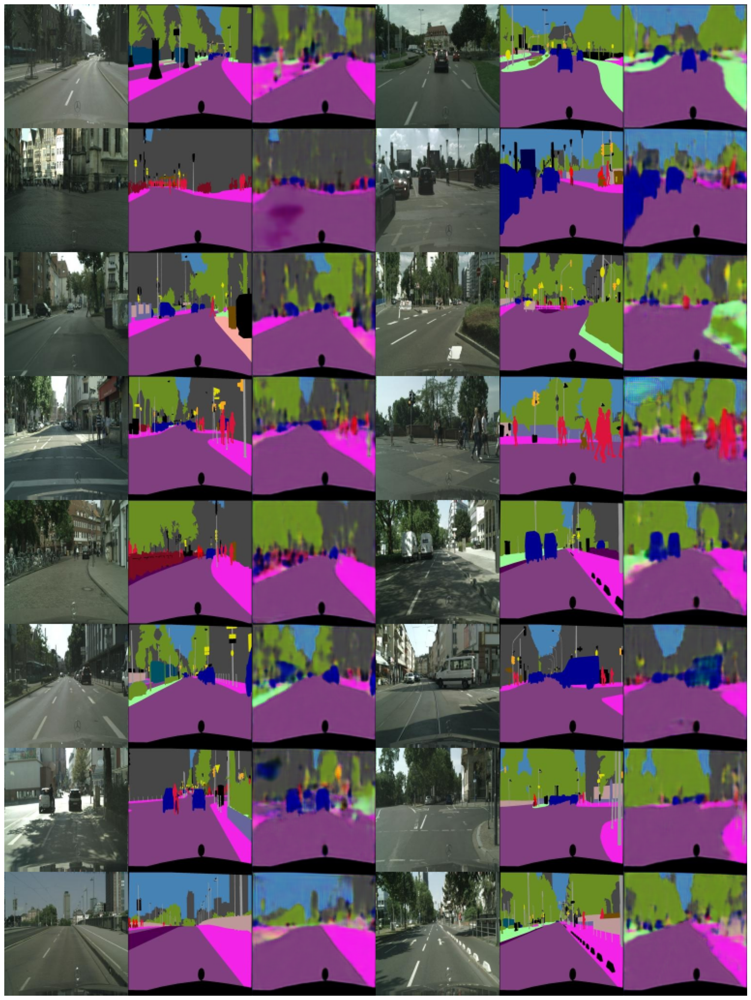

In [14]:

name = "Unet++"
model_name = models_dict["Unet++"]
model_name.load_state_dict(torch.load(os.path.join(working_dir, name + '_weights.pth')))
model_name.eval()
show(model_name, num_cols = 2)


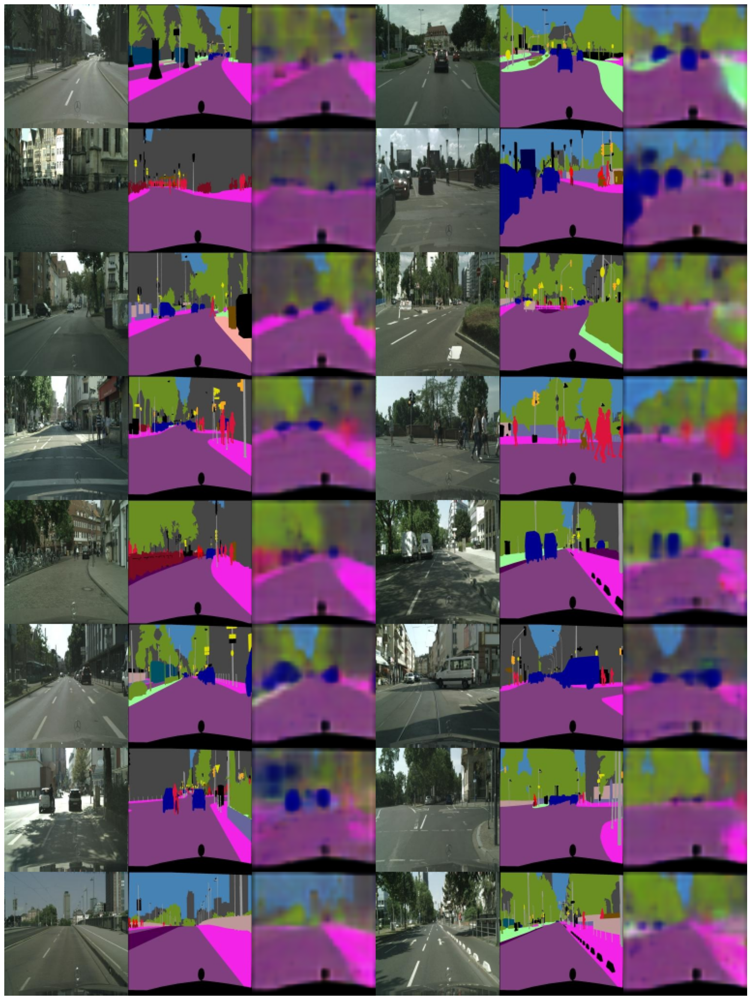

In [15]:
name = "FPN"
model_name = models_dict["FPN"]
model_name.load_state_dict(torch.load(os.path.join(working_dir, name + '_weights.pth')))
model_name.eval()
show(model_name, num_cols = 2)

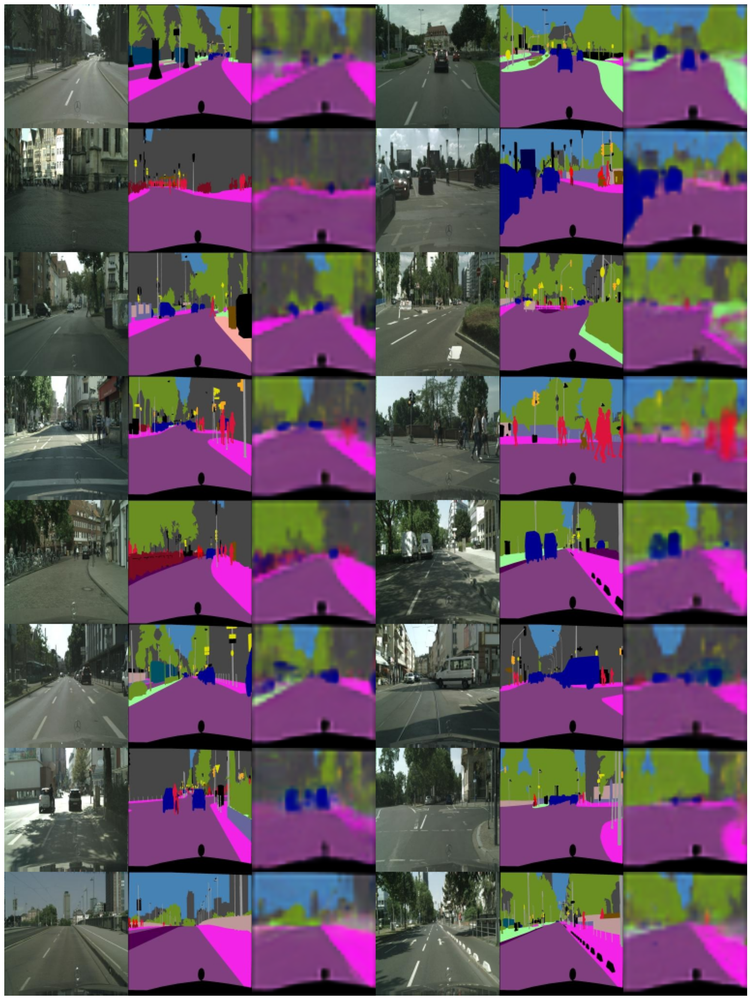

In [16]:
name = "DeepLab V3+"
model_name = models_dict["DeepLab V3+"]
model_name.load_state_dict(torch.load(os.path.join(working_dir, name + '_weights.pth')))
model_name.eval()
show(model_name, num_cols = 2)

In [17]:
DataFrames = {}
for i in range(3):
    name_df = pd.DataFrame(columns=['Train Loss', 'Train Dice Coefficient', 'Test Loss', 'Test Dice Coefficient'])
    for j in range(len(histories[i])):
        name_df.loc[len(name_df.index)] = histories[i][j]
    DataFrames[names[i]] = name_df

In [ ]:
DataFrames

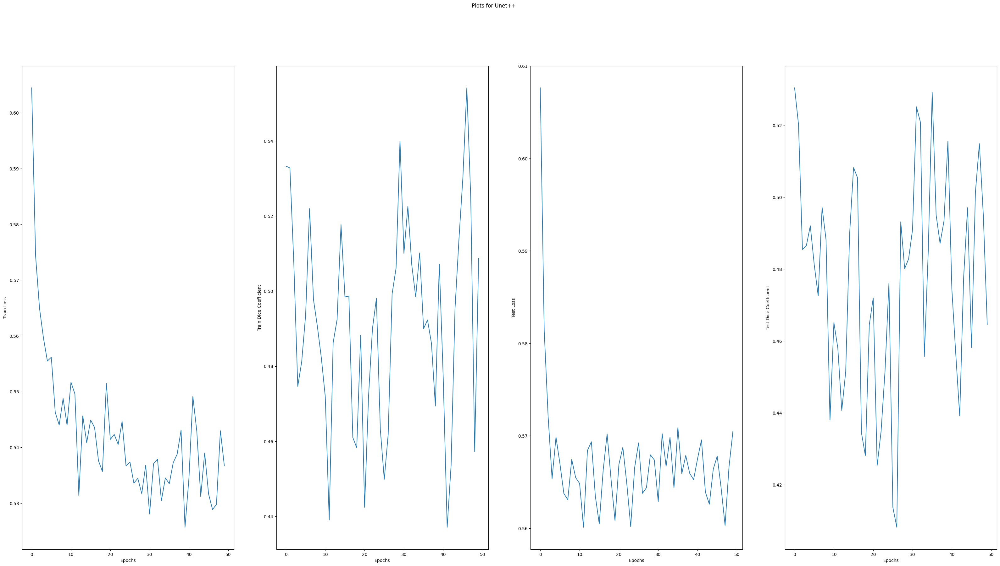

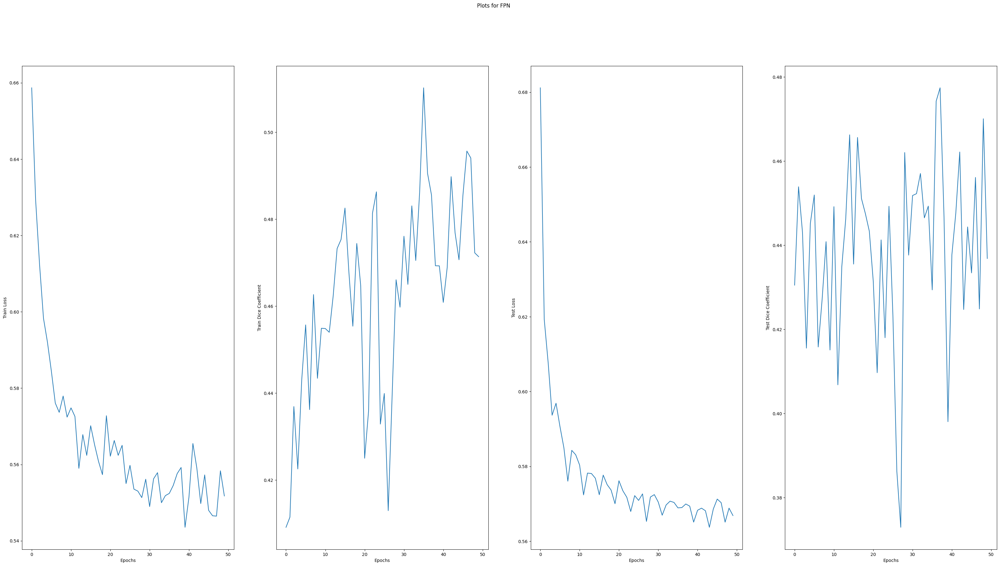

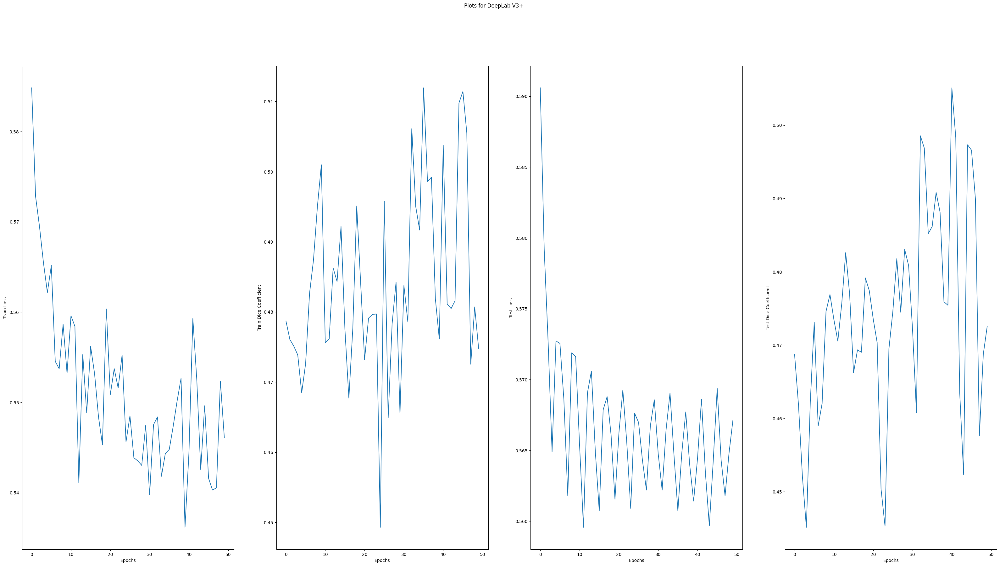

In [19]:
for i in names:
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (40, 20))
    fig.suptitle('Plots for '+i)
    ax1.plot(DataFrames[i]["Train Loss"])
#     ax1.set_ylim([0.5, 0.6])
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Train Loss')
    
    ax3.plot(DataFrames[i]["Test Loss"])
#     ax3.set_ylim([0.5, 0.6])
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Test Loss')
    
    ax2.plot(DataFrames[i]["Train Dice Coefficient"])
#     ax2.set_ylim([0.4, 0.5])
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Train Dice Coefficient')
    
    ax4.plot(DataFrames[i]["Test Dice Coefficient"])
#     ax4.set_ylim([0.4, 0.5])
    ax4.set_xlabel('Epochs')
    ax4.set_ylabel('Test Dice Coefficient')

# Evaluation Code

In [ ]:
# download models (zipped file)
!gdown --id 1zBaGBYfFHF0gn0YHqZ_sPZPx45-JmTkC -O cityscapes_data.zip

In [ ]:
import os
import zipfile

# extract the downloaded models to a local directory: Saved Model
local_zip = 'Saved Model.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('Saved Model')
zip_ref.close()

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Helper function to compute metrics
def compute_metrics(predictions, ground_truths, num_classes):
    predictions = predictions.argmax(axis=1).flatten()
    ground_truths = ground_truths.flatten()
    
    # Update labels to include only those present in ground_truths
    unique_labels = np.unique(ground_truths)
    cm = confusion_matrix(ground_truths, predictions, labels=unique_labels)
    accuracy = accuracy_score(ground_truths, predictions)
    precision = precision_score(ground_truths, predictions, average='macro', zero_division=0, labels=unique_labels)
    recall = recall_score(ground_truths, predictions, average='macro', zero_division=0, labels=unique_labels)
    f1 = f1_score(ground_truths, predictions, average='macro', zero_division=0, labels=unique_labels)
    
    return cm, accuracy, precision, recall, f1, unique_labels

# Labels for Cityscapes dataset
labels = ['road', 'sidewalk', 'building']  # Adjust according to your actual labels
num_classes = len(labels)

# Initialize storage for model metrics
model_metrics = {
    "Model": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": []
}

# Evaluation code
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

for model_name, model_instance in models_dict.items():
    name = model_name
    model_instance.to(device)
    
    # Load saved weights
    working_dir = 'Saved Model'
    weights_path = os.path.join(working_dir, name + '_weights.pth')
    model_instance.load_state_dict(torch.load(weights_path, map_location=device))
    print(f"Loaded model weights from {weights_path}")

    # Initialize storage for entire validation set predictions and ground truths
    all_predictions = []
    all_ground_truths = []

    # Create a new test_generator for each epoch to avoid StopIteration error
    test_generator = data_load(images_dir=val_images, batch_size=8, rescale=255.0)

    with torch.no_grad():
        for _ in range(len(test_generator)):
            try:
                test_images, test_masks = next(test_generator)
                test_images, test_masks = test_images.to(device), test_masks.to(device)
                test_predictions = model_instance(test_images)
                test_predictions = torch.softmax(test_predictions, dim=1)
                test_masks = test_masks.cpu().numpy()

                all_predictions.append(test_predictions.cpu().numpy())
                all_ground_truths.append(test_masks)

            except StopIteration:
                print("End of data loader reached")
                break

    # Concatenate all predictions and ground truths
    all_predictions = np.concatenate(all_predictions, axis=0)
    all_ground_truths = np.concatenate(all_ground_truths, axis=0)

    print(f"All predictions shape after concatenation: {all_predictions.shape}")
    print(f"All ground truths shape after concatenation: {all_ground_truths.shape}")

    # Reshape for metrics computation
    batch_size, num_classes, height, width = all_predictions.shape
    all_predictions = all_predictions.transpose(0, 2, 3, 1).reshape(-1, num_classes)
    all_ground_truths = all_ground_truths.transpose(0, 2, 3, 1).reshape(-1)

    print(f"All predictions shape after reshaping: {all_predictions.shape}")
    print(f"All ground truths shape after reshaping: {all_ground_truths.shape}")

    # Ensure both arrays are the same length
    min_length = min(len(all_predictions), len(all_ground_truths))
    all_predictions = all_predictions[:min_length]
    all_ground_truths = all_ground_truths[:min_length]

    # Convert ground truths to integer type
    all_ground_truths = all_ground_truths.astype(int)

    # Compute metrics for the entire validation set
    cm, accuracy, precision, recall, f1, unique_labels = compute_metrics(all_predictions, all_ground_truths, num_classes)
    
    # Print the average metrics
    print(f"Model: {name}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Plot confusion matrix
    plot_confusion_matrix(cm, [labels[i] for i in unique_labels], normalize=True)

    # Store metrics for comparison table
    model_metrics["Model"].append(name)
    model_metrics["Accuracy"].append(accuracy)
    model_metrics["Precision"].append(precision)
    model_metrics["Recall"].append(recall)
    model_metrics["F1 Score"].append(f1)

# Create a DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(model_metrics)

# Display the metrics DataFrame
print(metrics_df)

# Plot the metrics for comparison
metrics_df.set_index('Model').plot(kind='bar', figsize=(15, 7))
plt.title('Model Comparison')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.show()
